In [1]:
# faster RCNN related
import _init_paths
from fast_rcnn.config import cfg
from fast_rcnn.test import im_detect
from fast_rcnn.nms_wrapper import nms
import caffe

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import sys
import cv2
import json
import math
import random
from util_fxns import *
from collections import Counter

%matplotlib inline

In [2]:
cfg.GPU_ID = 1
caffe.set_device(1)
caffe.set_mode_gpu()

In [3]:
# define directories
data_dir = "/home/ai2-c3p0/Documents/code/todd_working_directory/KaggleFisheries/data/"
train_dir = data_dir+"train/" # raw data
# should be one json per class label
# jsons should be in sloth format http://sloth.readthedocs.io/en/latest/first_steps.html
bounding_boxes_dir = "/home/ai2-c3p0/Documents/code/todd_working_directory/KaggleFisheries/data/bounding_boxes/"

In [4]:
CLASSES = ('__background__','fish')

NETS = {'vgg16': ('VGG16','vgg16_faster_rcnn_fishies_iter_10000.caffemodel')}

In [5]:
cfg.TEST.HAS_RPN = True  # Use RPN for proposals

prototxt = os.path.join(cfg.MODELS_DIR, NETS['vgg16'][0],
                       'faster_rcnn_end2end_fishies_binary', 'test.prototxt')

faster_rcnn_dir = '/home/ai2-c3p0/Documents/code/todd_working_directory/KaggleFisheries/py-faster-rcnn/output/faster_rcnn_end2end/kaggle_fishies_train/'

caffemodel = os.path.join(faster_rcnn_dir,NETS['vgg16'][1])

if not os.path.isfile(caffemodel):
    raise IOError(('{:s} not found.\nDid you run ./data/script/'
                   'fetch_faster_rcnn_models.sh?').format(caffemodel))

In [6]:
net = caffe.Net(prototxt, caffemodel, caffe.TEST)
print 'Loaded network {:s}'.format(caffemodel)

Loaded network /home/ai2-c3p0/Documents/code/todd_working_directory/KaggleFisheries/py-faster-rcnn/output/faster_rcnn_end2end/kaggle_fishies_train/vgg16_faster_rcnn_fishies_iter_10000.caffemodel


In [7]:
def predict(image_path,classes=None,conf_thresh=.5,nms_thresh=0.01,net=None,
         visualize_detections=False,fig_size=12, buff=10, vis_ground_truth=False, annotations=None):
    """Detect object classes in an image using pre-computed object proposals."""
    
    im = cv2.imread(image_path)
    image_name = image_path.split("/")[-1]
    img_shape = im.shape
    
    # Detect all object classes and regress object bounds
    scores, boxes = im_detect(net, im)
    #     print ('Detection took {:.3f}s for '
    #            '{:d} object proposals').format(timer.total_time, boxes.shape[0])
    
    no_detections = []
    # Visualize detections for each class
    for cls_ind, cls in enumerate(classes[1:]):
        cls_ind += 1 # because we skipped background
        cls_boxes = boxes[:, 4*cls_ind:4*(cls_ind + 1)] # bounding boxes
        cls_scores = scores[:, cls_ind] # probability scores
        dets = np.hstack((cls_boxes, cls_scores[:, np.newaxis])).astype(np.float32)
        keep = nms(dets, nms_thresh) # determine which boxes to keep based on the nms_thresh
        dets = dets[keep, :] # final detections
        
        inds = np.where(dets[:, -1] >= conf_thresh)[0]
        
        if visualize_detections and len(inds) != 0:
            vis_detections(image_name, im, cls, dets, conf_thresh, fig_size,buff,vis_ground_truth, annotations)
        # will return image name if no detections
        
        if len(inds) == 0:
            return image_path
        else:
            pred_results = bbox_results(image_path, img_shape, cls, dets, inds, buff)
            return pred_results

In [8]:
def bbox_results(image_path, img_shape, class_name, dets, inds, buff=10):
    """Print detected bounding boxes for an image
    Args:
        image_path (str) : 
    """
    
    image_file_name = image_path.split("/")[-1]
    class_label = image_path.split("/")[-2] # ground truth class label
    annotations_pred = {}
    annotations_pred['full_path'] = image_path
    annotations_pred['faster_rcnn_class'] = class_name
    annotations_pred['ground_truth_label'] = class_label
    annotations_pred['annotation_results'] = []
    
    annotation_count = 0
    for i in inds:
        bbox = dets[i, :4] # bbox
        bbox[0], bbox[1], bbox[2], bbox[3] = bbox[0]-buff,bbox[1]-buff, bbox[2]+buff, bbox[3]+buff
        bbox = check_bbox_in_image(bbox,img_shape)
        score = dets[i, -1] # probability
        annotations_pred['annotation_results'].append({"bbox":bbox.tolist(), "probability":score, 
                                                       "annotation_count":annotation_count})
        annotation_count += 1
        
    return annotations_pred

In [9]:
def vis_detections(image_name, im, class_name, dets, conf_thresh, fig_size=12, buff=10, vis_ground_truth=False, annotations=None):
    """Draw detected bounding boxes."""
    inds = np.where(dets[:, -1] >= conf_thresh)[0]
    vis_ground_truth=vis_ground_truth

    im = im[:, :, (2, 1, 0)] # swapping color channels
    img_shape = im.shape
    fig, ax = plt.subplots(figsize=(fig_size, fig_size))
    ax.imshow(im, aspect='equal')
    for i in inds:
        bbox = dets[i, :4]
        score = dets[i, -1]
        #adjust the bounding box according to the buffer
        bbox[0], bbox[1], bbox[2], bbox[3] = bbox[0]-buff,bbox[1]-buff, bbox[2]+buff, bbox[3]+buff
        bbox = check_bbox_in_image(bbox,img_shape)
        ax.add_patch(
            plt.Rectangle((bbox[0], bbox[1]),
                          bbox[2] - bbox[0],
                          bbox[3] - bbox[1], fill=False,
                          edgecolor='red', linewidth=2)
            )
        ax.text(bbox[0], bbox[1] - 2,
                '{:s} {:.3f}'.format(class_name, score),
                bbox=dict(facecolor='blue', alpha=0.5),
                fontsize=14, color='white')
        
    if vis_ground_truth:
        try:
            bboxes = bbox_coord_extractor(annotations,image_name,buff)
            for bbox_true in bboxes:
                bbox_true = check_bbox_in_image(bbox_true,img_shape)
                ax.add_patch(
                        plt.Rectangle((bbox_true[0], bbox_true[1]),
                                      bbox_true[2] - bbox_true[0],
                                      bbox_true[3] - bbox_true[1], fill=False,
                                      edgecolor='white', linewidth=2)
                        )
        except:
            "No fish"
    ax.set_title(('{} detections with '
                  'p({} | box) >= {:.1f}').format(class_name, class_name,
                                                  conf_thresh),
                  fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.draw()

In [10]:
# create a dictionary of all annotations
annotations = {}
for bboxes in os.listdir(bounding_boxes_dir):
    if os.path.isfile(bounding_boxes_dir+bboxes):
        file_path = bounding_boxes_dir+bboxes
    else:
        continue
    class_label = bboxes.split("_")[0]

    with open(file_path, 'r') as data_file:
        json_data = data_file.read()
        
    data = json.loads(json_data)
    
    for im in data:
        # this the faster rcnn class we are trying to predict
        # in this example, just providing a fish label results in binary classes: __background__, fish
        im['label'] = 'fish'
        im['ground_truth_label'] = class_label
        # there were a few that had complete paths instead of just an image
        filename_clean = im['filename'].split("/")[-1]
        annotations[filename_clean] = im # master annotations list

In [11]:
test_images = []
with open("../../data/test_images.txt") as f:
    for line in f.readlines():
        test_images.append(line.replace("\n",""))

Image name: img_06143.jpg, image class: ALB


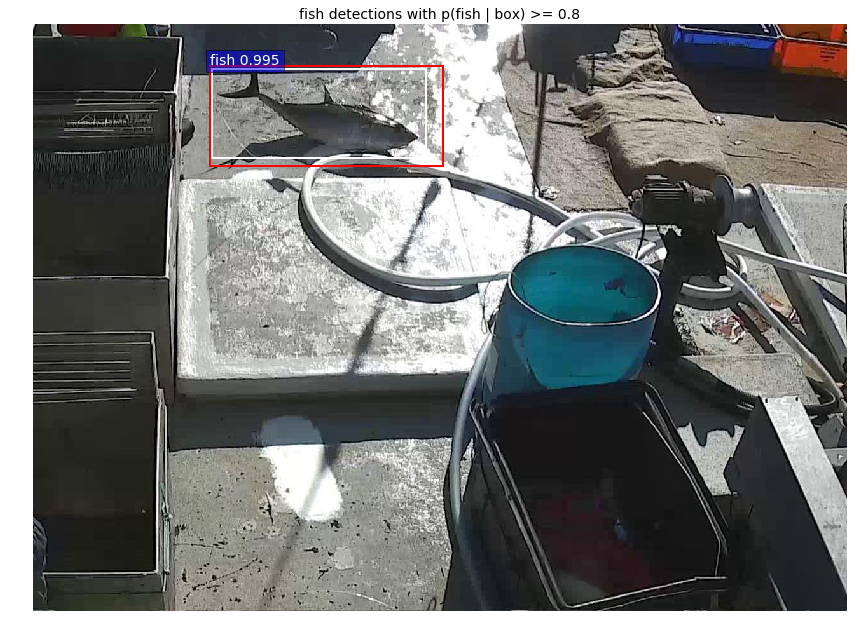

Image name: img_00673.jpg, image class: NoF


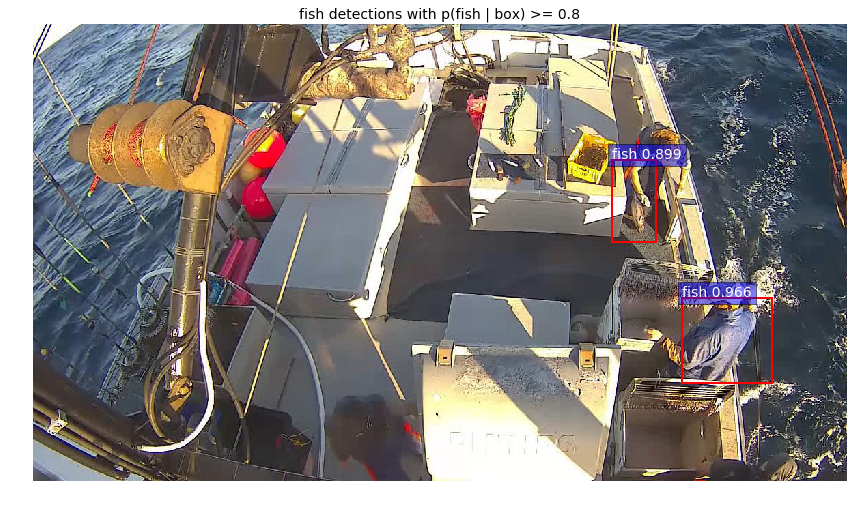

Image name: img_04837.jpg, image class: SHARK


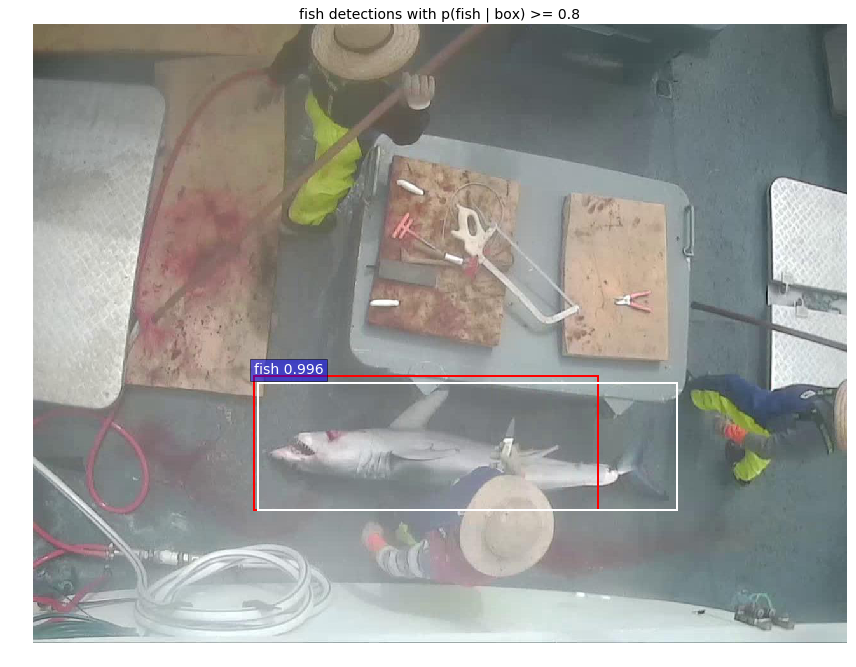

Image name: img_01797.jpg, image class: ALB


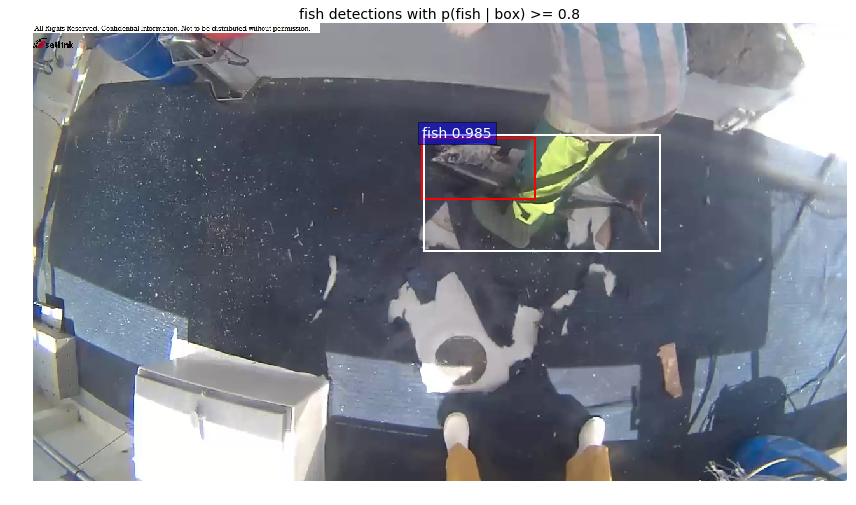

Image name: img_00866.jpg, image class: ALB


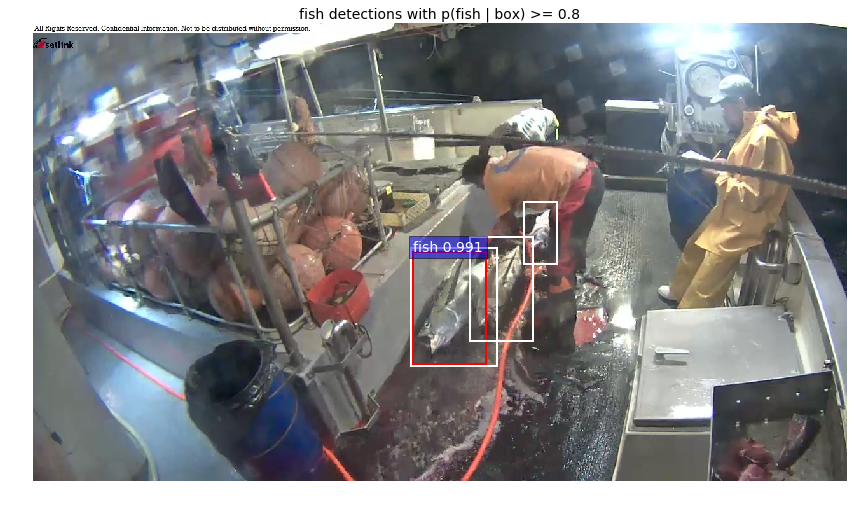

Image name: img_06058.jpg, image class: ALB


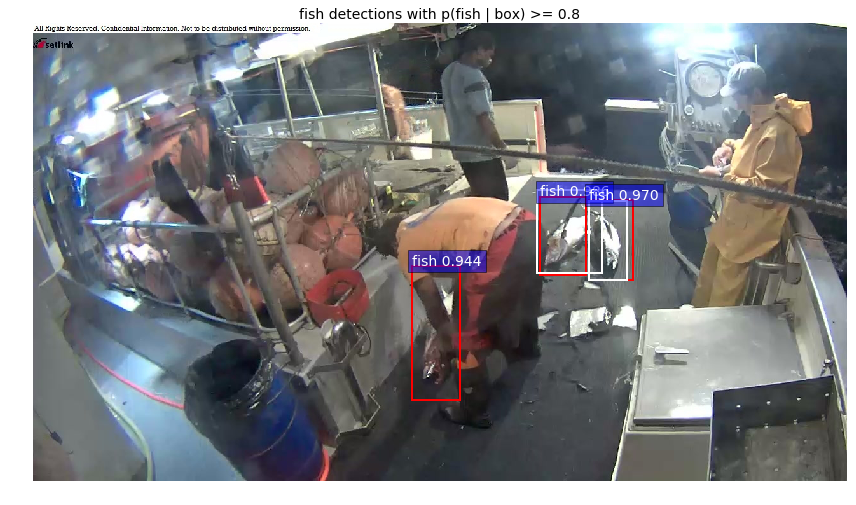

Image name: img_00609.jpg, image class: NoF
Image name: img_05729.jpg, image class: YFT


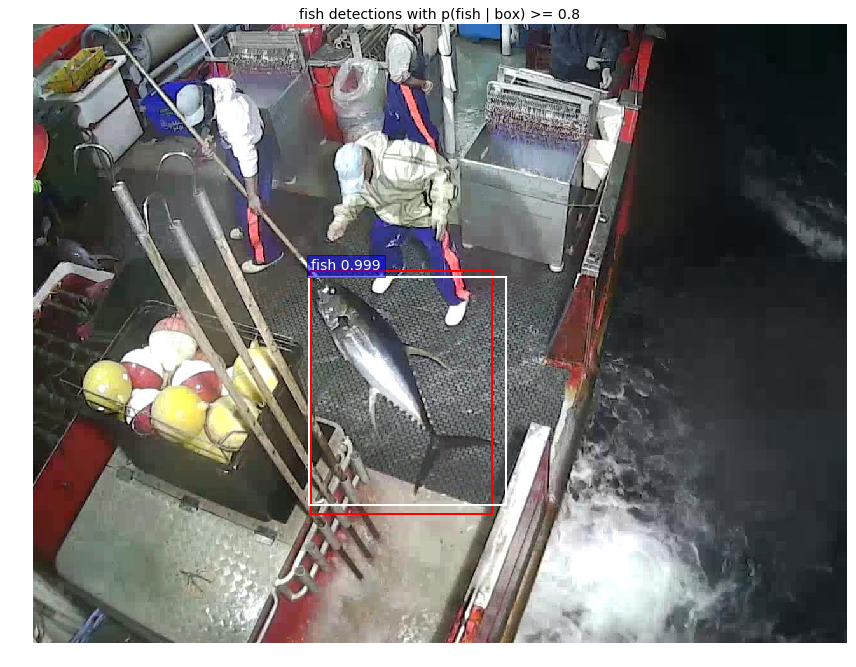

Image name: img_07510.jpg, image class: YFT


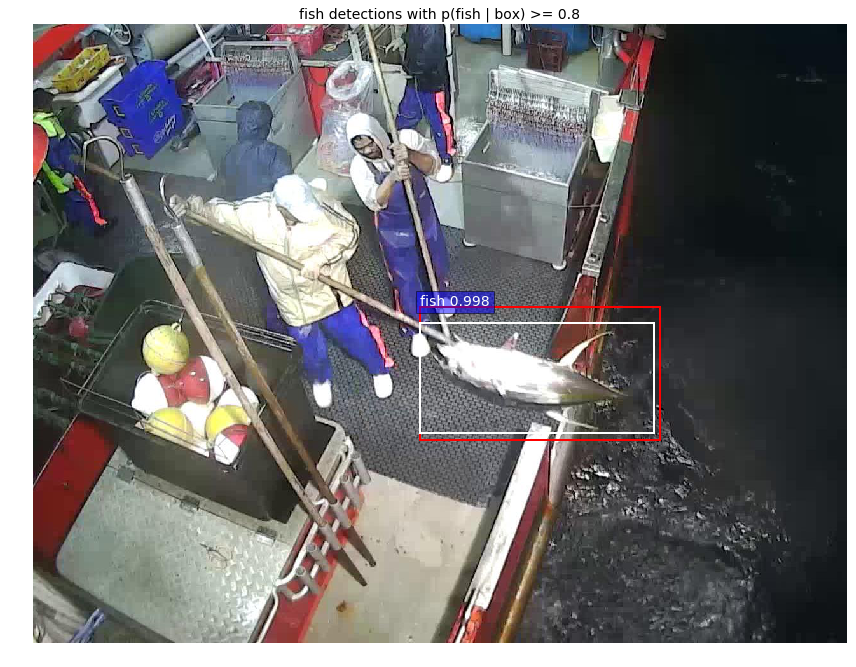

Image name: img_03366.jpg, image class: BET


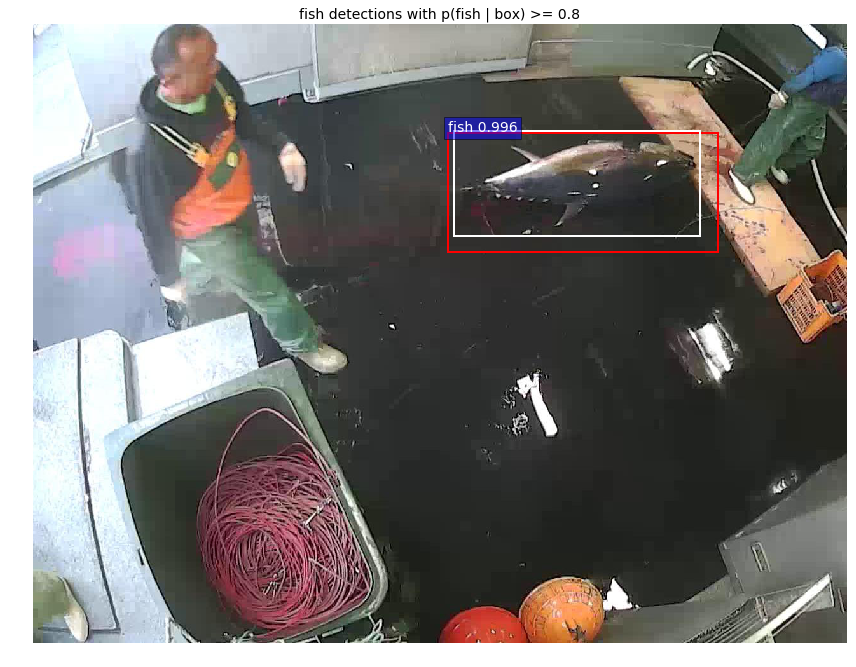

Image name: img_07801.jpg, image class: ALB


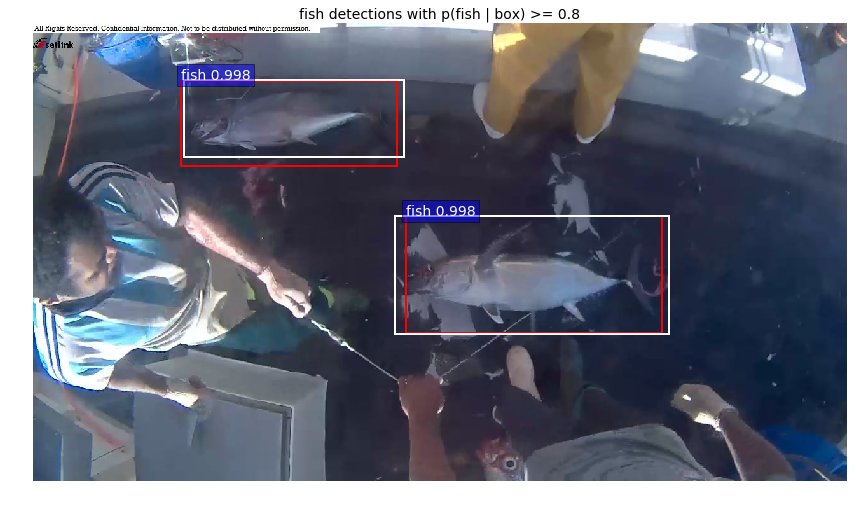

Image name: img_04783.jpg, image class: ALB


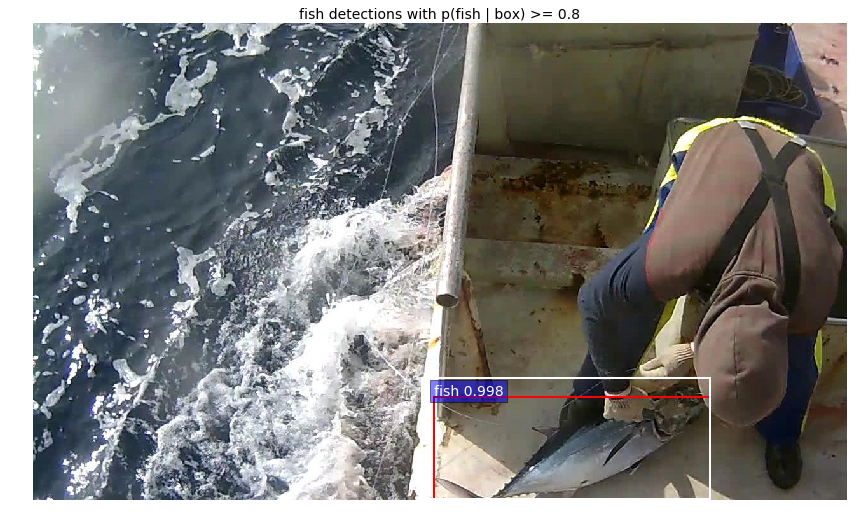

Image name: img_00360.jpg, image class: NoF
Image name: img_05975.jpg, image class: YFT


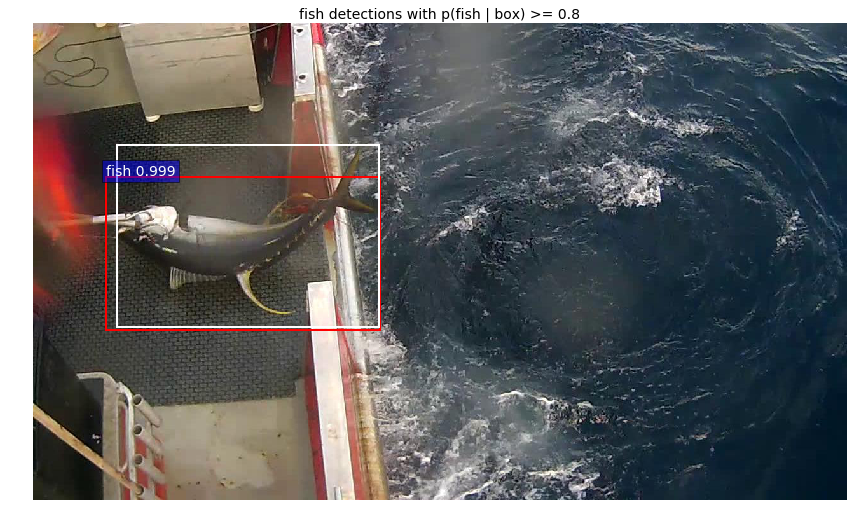

Image name: img_02525.jpg, image class: YFT


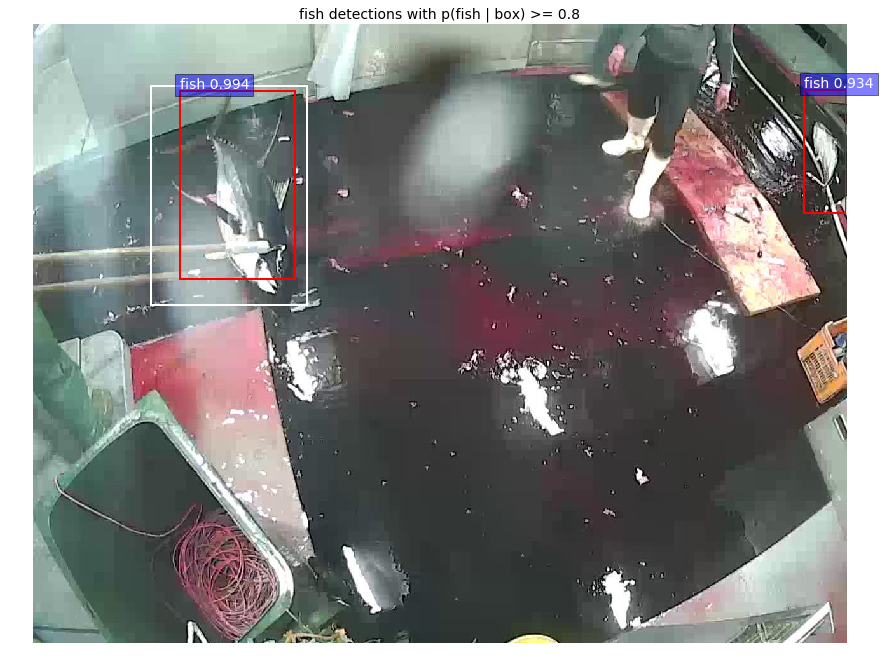

Image name: img_04466.jpg, image class: ALB


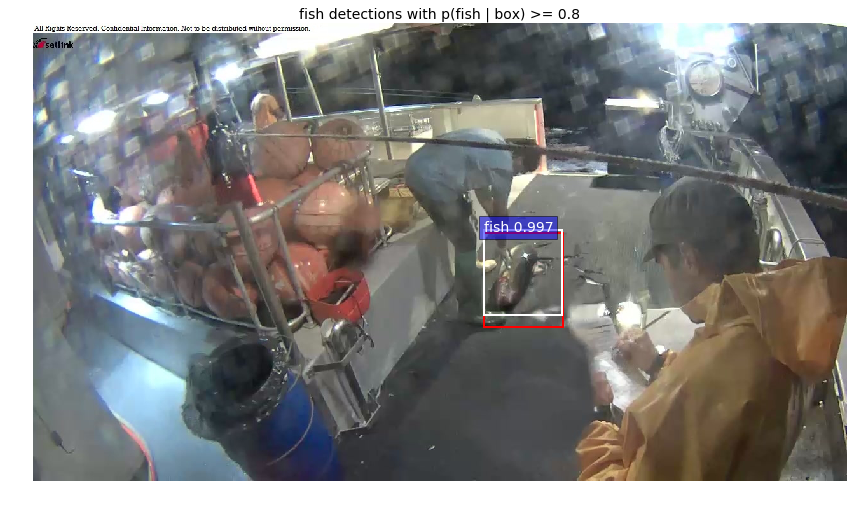

Image name: img_07000.jpg, image class: ALB


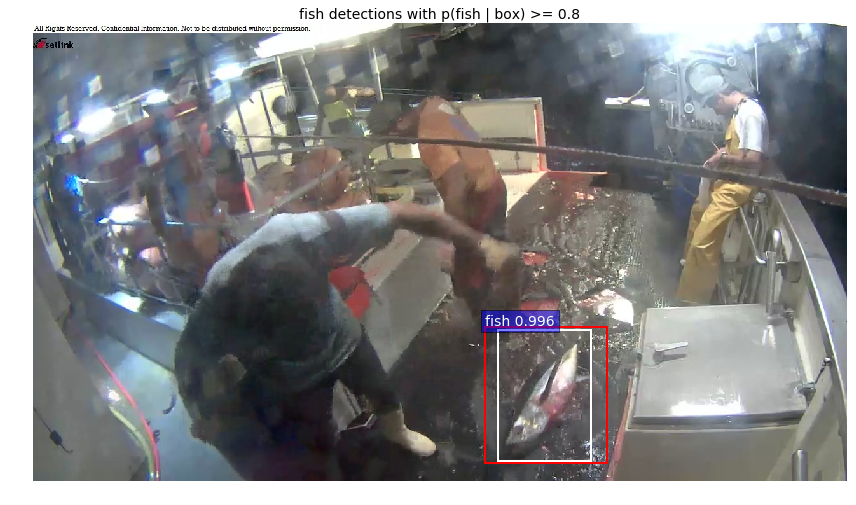

Image name: img_00507.jpg, image class: ALB


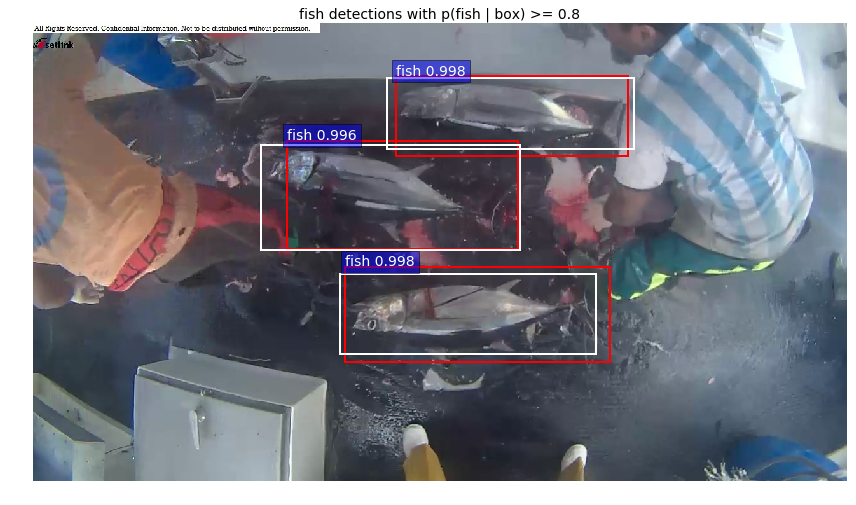

Image name: img_02948.jpg, image class: ALB


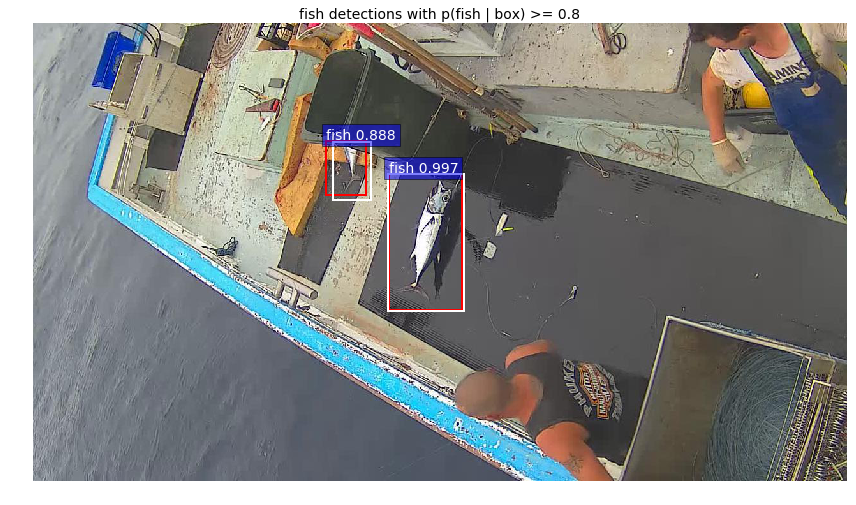

Image name: img_04347.jpg, image class: ALB


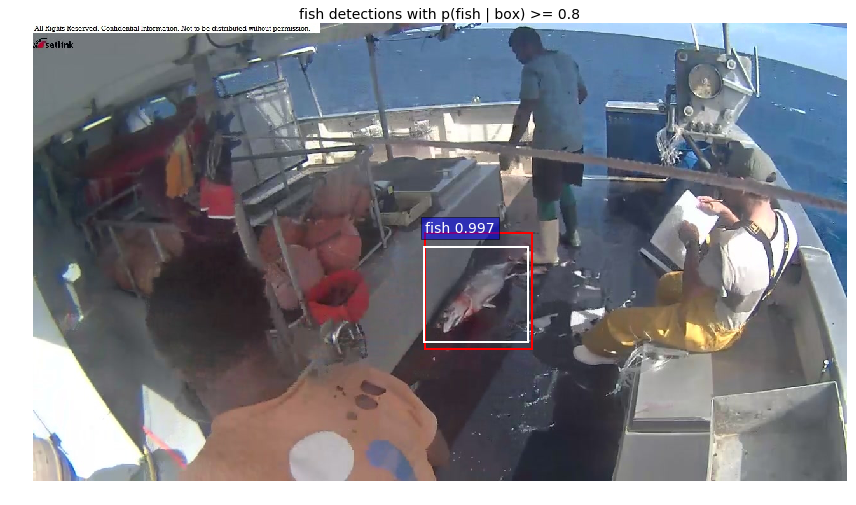

In [12]:
annotations_pred = {}
no_fish = []

for img in test_images[:20]:
    img_name = img.split("/")[-1]
    img_class = img.split("/")[-2]
    print "Image name: {}, image class: {}".format(img_name,img_class)
    return_val = predict(img, classes=CLASSES, conf_thresh=.8, net=net, visualize_detections=True,buff=10,vis_ground_truth=True,annotations=annotations)
    if type(return_val) == str:
        no_fish.append(return_val)
    else:
        annotations_pred[img_name] = return_val
    plt.show()

In [14]:
# no visualization, predict results for all test images
annotations_pred = {}
no_fish = []

for img in test_images:
    img_name = img.split("/")[-1]
    img_class = img.split("/")[-2]
    #print "Image name: {}, image class: {}".format(img_name,img_class)
    return_val = predict(img, classes=CLASSES, conf_thresh=.8, net=net, visualize_detections=False,buff=10,vis_ground_truth=False,annotations=annotations)
    if type(return_val) == str:
        no_fish.append(return_val)
    else:
        annotations_pred[img_name] = return_val
    plt.show()

In [15]:
# need to print out average IoU scores, precision, recall, and probabilities for each species of fish
# use cropped training images to continue training the classifier
# remove all NoF training examples that contain a fish and don't use crops from NoF images

In [16]:
def intersection_over_union(bbox_true,bbox_pred):
    xmin_true, xmin_pred = bbox_true[0], bbox_pred[0]
    ymin_true, ymin_pred = bbox_true[1], bbox_pred[1]
    xmax_true, xmax_pred = bbox_true[2], bbox_pred[2]
    ymax_true, ymax_pred = bbox_true[3], bbox_pred[3]
    
    # intersection
    intersection = max(0, min(xmax_true, xmax_pred) - max(xmin_true, xmin_pred)) * \
    max(0, min(ymax_true, ymax_pred) - max(ymin_true, ymin_pred)) 
    
    # bbox areas
    area_true = (xmax_true - xmin_true) * (ymax_true - ymin_true)
    area_pred = (xmax_pred - xmin_pred) * (ymax_pred - ymin_pred)
    
    #union
    union = area_true + area_pred - intersection
    IoU_score = float(intersection / union)
    
    return IoU_score

In [107]:
def evaluate_bboxes(image_name, predicted_annotations, ground_truth_annotations, valid_threshold=0.5, buff=10):
    """Evaulates the IoU scores for all predicted bounding boxes in an image
    
    Args:
        image_name (str) : image name
        bbox_preds (list) : list of all the predicted bounding boxes for an image
        predicted_annotations (dict) : the predicted annotations from faster rcnn
        ground_truth_annotations (dict) : the true annotations to used as a basis for evaluation
        valid_threshold (float) : threshold for IoU score; used to determine if the predicted bbox is valid
        buff (int) : optional pixel buffer to use around ground truth annotations 
    
    Returns:
        results (list) : list containing image_name, bbox_counter, ground_truth_class, IoU_score, valid (bool), probability, bbox, filepath
    """
    filepath = predicted_annotations[image_name]["full_path"]
    results = []
    for bbox_pred in predicted_annotations[image_name]["annotation_results"]:
        try:
            ground_truth_class = ground_truth_annotations[image_name]["ground_truth_label"]
            IoU_list = []
            valid = False
            for bbox_true in bbox_coord_extractor(ground_truth_annotations,image_name,buff):
                IoU_temp = intersection_over_union(bbox_true, bbox_pred["bbox"])
                IoU_list.append(IoU_temp)
                if IoU_temp > valid_threshold:
                    valid = True
                    break # if we find a match, continue the outer loop    
            IoU_list = sorted(IoU_list,reverse=True)
            results.append([image_name, bbox_pred["annotation_count"], ground_truth_class, IoU_list[0], valid, bbox_pred["probability"],bbox_pred["bbox"],filepath])
            
        except Exception as e:
            # NoF class
            results.append([image_name, bbox_pred["annotation_count"], "NoF", 0.0, False, bbox_pred["probability"],bbox_pred["bbox"],filepath])    
    
    return results

In [108]:
results_cols = ["image_name", "bbox_counter", "ground_truth_class", "IoU_score", "valid", "probability","bbox","filepath"]
rename_dict = {}
for i, col_name in enumerate(results_cols):
    rename_dict[i] = col_name

In [19]:
results_df = pd.DataFrame()
for photo in annotations_pred:
    results_df = results_df.append(evaluate_bboxes(photo,annotations_pred,annotations,0.5,10))

In [20]:
results_df = results_df.rename_axis(rename_dict,1)
results_df.head()

,image_name,bbox_counter,ground_truth_class,IoU_score,valid,probability
0,img_03622.jpg,0,YFT,0.844008,True,0.996431
0,img_05312.jpg,0,ALB,0.708727,True,0.992926
0,img_07204.jpg,0,ALB,0.904673,True,0.997170
1,img_07204.jpg,1,ALB,0.667591,True,0.995052
0,img_01086.jpg,0,ALB,0.620561,True,0.996818


In [21]:
results_df.groupby(by="ground_truth_class").mean().reset_index()

,ground_truth_class,bbox_counter,IoU_score,valid,probability
0,ALB,0.461538,0.731362,0.900000,0.990777
1,BET,0.250000,0.750377,0.916667,0.995126
2,DOL,0.000000,0.721916,1.000000,0.996224
3,LAG,0.300000,0.830755,1.000000,0.995756
4,NoF,0.166667,0.000000,0.000000,0.919133
5,OTHER,0.300000,0.766773,0.900000,0.987257
6,SHARK,0.333333,0.722648,0.888889,0.996087
7,YFT,0.130435,0.728145,0.891304,0.990528


In [49]:
funcs = {'valid':['sum','count']}
evaluate_df = results_df.groupby(by="ground_truth_class").agg(funcs).reset_index()
evaluate_df.columns.set_levels(['sum','count',"ground_truth_class"], 1, inplace=True)
evaluate_df.columns = evaluate_df.columns.droplevel()
evaluate_df['incorrect'] = evaluate_df['count'] - evaluate_df['sum']

In [50]:
test_images_file_names = []
for image in test_images:
    test_images_file_names.append(image.split("/")[-1])
counter = Counter() 
for image in annotations:
    if image in test_images_file_names:
        counter[annotations[image]['ground_truth_label']] += len(annotations[image]["annotations"])
counter["NoF"] = 0
ground_truth_counts = []
for label in counter:
    ground_truth_counts.append((label, counter[label]))
ground_truth_counts = zip(*sorted(ground_truth_counts))[1]

In [51]:
evaluate_df = evaluate_df.rename_axis({"sum":"correct","count":"predictions_count"},1)
evaluate_df["ground_truth_counts"] = ground_truth_counts
ordered_cols = ["ground_truth_class","correct","incorrect","predictions_count","ground_truth_counts"]
evaluate_df = evaluate_df[ordered_cols]

In [53]:
evaluate_df["precision"] = evaluate_df["correct"] / evaluate_df["predictions_count"]
evaluate_df["recall"] = evaluate_df["correct"] / evaluate_df["ground_truth_counts"]

In [54]:
evaluate_df

,ground_truth_class,correct,incorrect,predictions_count,ground_truth_counts,precision,recall
0,ALB,117.0,13.0,130,126,0.900000,0.928571
1,BET,11.0,1.0,12,11,0.916667,1.000000
2,DOL,2.0,0.0,2,2,1.000000,1.000000
3,LAG,10.0,0.0,10,10,1.000000,1.000000
4,NoF,0.0,6.0,6,0,0.000000,NaN
5,OTHER,18.0,2.0,20,18,0.900000,1.000000
6,SHARK,8.0,1.0,9,8,0.888889,1.000000
7,YFT,41.0,5.0,46,43,0.891304,0.953488


In [57]:
# overall precision and recall
print "overall precision: {:.3f}".format(evaluate_df["correct"].sum() / evaluate_df["predictions_count"].sum())
print "overall recall: {:.3f}".format(evaluate_df["correct"].sum() / evaluate_df["ground_truth_counts"].sum())

overall precision: 0.881
overall recall: 0.950


### Predict on all the training and test examples and use quality crops to train the classifier

In [ ]:
# all the pictures in train dir
# flag the NoF pictures with predictions and delete them from the training set (don't save the crops either)
# if a crop is valid and has greater than 80% certainty then save it for cropped classifier training
# save 80% to the cropped_images_train folder and 10% in the val, and test folders respectively
# finish inference code
# bonus would be to update the annotations list (>.8 prob.)

In [73]:
train_images = []
for label in os.listdir(train_dir):
    if os.path.isdir(train_dir+label):
        for im in os.listdir(train_dir+label):
            train_images.append(os.path.join(train_dir,label,im))

In [69]:
# predict results for all train images
train_annotations = {}
train_no_fish = []

for img in train_images:
    img_name = img.split("/")[-1]
    img_class = img.split("/")[-2]
    #print "Image name: {}, image class: {}".format(img_name,img_class)
    return_val = predict(img, classes=CLASSES, conf_thresh=.8, net=net, visualize_detections=False,buff=10,vis_ground_truth=False,annotations=annotations)
    if type(return_val) == str:
        train_no_fish.append(return_val)
    else:
        train_annotations[img_name] = return_val

In [124]:
train_results_df = pd.DataFrame()
for photo in train_annotations:
    train_results_df = train_results_df.append(evaluate_bboxes(photo,train_annotations,annotations,0.5,10))

In [125]:
train_results_df = train_results_df.rename_axis(rename_dict,1)
train_results_df.head()

,image_name,bbox_counter,ground_truth_class,IoU_score,valid,probability,bbox,filepath
0,img_04908.jpg,0,YFT,0.880879,True,0.997801,"[451.215698242, 483.826599121, 898.451171875, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...
0,img_07566.jpg,0,ALB,0.824082,True,0.994501,"[151.053619385, 351.681396484, 339.948516846, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...
0,img_00485.jpg,0,OTHER,0.795158,True,0.996899,"[529.691833496, 381.183868408, 706.066223145, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...
0,img_04433.jpg,0,ALB,0.818101,True,0.995455,"[461.854095459, 364.876647949, 556.263366699, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...
0,img_03905.jpg,0,ALB,0.795910,True,0.997591,"[442.268371582, 371.975158691, 568.787658691, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...


In [126]:
train_results_df = train_results_df.sample(frac=1,random_state=42)
train_results_df.head()

,image_name,bbox_counter,ground_truth_class,IoU_score,valid,probability,bbox,filepath
0,img_07603.jpg,0,ALB,0.916292,True,0.996805,"[632.651123047, 361.856140137, 790.866577148, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...
0,img_05868.jpg,0,ALB,0.710467,True,0.997423,"[345.989135742, 132.404205322, 663.077758789, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...
0,img_02942.jpg,0,OTHER,0.823604,True,0.998229,"[800.842895508, 263.248382568, 946.040649414, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...
0,img_05094.jpg,0,ALB,0.846352,True,0.998797,"[398.054138184, 159.036743164, 762.354309082, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...
2,img_02551.jpg,2,ALB,0.813326,True,0.938931,"[843.654418945, 275.782470703, 1156.66918945, ...",/home/ai2-c3p0/Documents/code/todd_working_dir...


In [127]:
# if prob > .8 and IoU > .5 then use the bounding box for a crop and save it 

In [128]:
def crop_im(image_path=None,bbox=None,bbox_counter=None,ground_truth_class=None,save_dir=None):
    """Crop image for all instances of a class in an image and save the results to 
    a folder for that class
    
    Args:
        image_path (str) : path where the image is saved
        annotations (dict) : dictionary of annotations per image
        save_dir (str) : path to the directory to save crops
    """
    im = cv2.imread(image_path)
    pic = image_path.split("/")[-1]
    pic_name = pic.split(".")[0]
    img_shape = im.shape
    
    y = int(math.ceil(bbox[1]))
    x = int(math.ceil(bbox[0]))
    h = int(math.ceil(bbox[3] - bbox[1]))
    w = int(math.ceil(bbox[2] - bbox[0]))

    im_crop = im[y:y+h,x:x+w]
    # rotate images if they are taller than they are wide
    # reorientating images should be helpful to the classifier
    if h / float(w) > 1:
        im_crop = rotate_bound(im_crop,90)

    cv2.imwrite(save_dir+"{0}/{1}_{2}.jpg".format(ground_truth_class,\
                                                  pic_name,bbox_counter),im_crop)

In [129]:
save_df = train_results_df[(train_results_df["IoU_score"] > .5) & (train_results_df["probability"] > .8)]

In [130]:
# split train, val, and test data
train_size = .94
validation_size = (1 - train_size) / 2.0
test_size = (1 - train_size) / 2.0

train_ind_stop = int(round(len(save_df)*train_size))
val_ind_stop = int(round(len(save_df)*(train_size+validation_size)))

train_pics = save_df.iloc[:train_ind_stop]
val_pics = save_df.iloc[train_ind_stop:val_ind_stop]
test_pics = save_df.iloc[val_ind_stop:]
print "Train count: {:,}, Val count: {:,}, Test count: {:,}".format(len(train_pics), len(val_pics), len(test_pics))

Train count: 3,950, Val count: 126, Test count: 126


In [134]:
# make sure this is formatted correctly, will have to rerun the other script if not
for _,row in train_pics.iterrows():
    crop_im(row["filepath"],row["bbox"],(row["bbox_counter"]+1)*100,row["ground_truth_class"],data_dir+"cropped_images_train/")
for _,row in val_pics.iterrows():
    crop_im(row["filepath"],row["bbox"],(row["bbox_counter"]+1)*100,row["ground_truth_class"],data_dir+"cropped_images_val/")
for _,row in test_pics.iterrows():
    crop_im(row["filepath"],row["bbox"],(row["bbox_counter"]+1)*100,row["ground_truth_class"],data_dir+"cropped_images_test/")

In [136]:
def count_dir(directory):
    count=0
    for folder in os.listdir(directory):
        for _ in os.listdir(directory+folder):
            count+=1
    
    return count

In [137]:
len_checks = ["cropped_images_train/","cropped_images_val/","cropped_images_test/"]
for check in len_checks:
    print check, count_dir(data_dir+check)

cropped_images_train/ 8430
cropped_images_val/ 712
cropped_images_test/ 687
